
## Methodology
1. Data Collection
2. Data Exploration and Feature Selection
3. Apply Unsupervised Learning Methods
    1. Using PCA and K-means to do the clustering (visualizations and many clusters, justify using silhouette scores)
    2. For PCA/K-means (K>= 4), draw the bar graphs to answer the following sub questions:
        1. Which cluster contains the most train delay on Friday?
        2. Which cluster contains the most train delays for the rush hour in the weekday?
    3. Using T-sne and GMM to do the clustering (visualizations and many clusters, justify using silhouette scores)
    4. For T-sne/GMM (K>= 4), draw the bar graphs to answer the following sub questions:
        1. Which cluster contains the most train delay on Friday?
        2. Which cluster contains the most train delays for the rush hour in the weekday?

4. Write up analysis and comparison
5. Conclusions



#1. Data Collection

In [ ]:
# Import necessary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import ttest_ind
import time
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage

from google.colab import drive
from sklearn.preprocessing import StandardScaler, LabelEncoder


import warnings

warnings.filterwarnings('ignore')

In [ ]:
# This is for the initial run. All subsequent runs use the file already in the drive
# # Set up environment
# # 1. Data Collection:
# import os

# drive.mount('/content/drive')

# # Directory where all CSV files are located
# csv_dir = '/content/drive/My Drive/Data Science/Capstone3/Data'

# # Get all CSV files in the directory
# all_csv_files = [file for file in os.listdir(csv_dir) if file.endswith('.csv')]
# print(f"Total number of CSV files containing 'NJ Transit + Amtrak (NEC) Rail' data: {len(all_csv_files)}")

# # Create an empty list to store individual dataframes
# list_of_dataframes = []

# # Loop through all CSV files and read them into individual dataframes
# for csv_file in all_csv_files:
#     filepath = os.path.join(csv_dir, csv_file)
#     df = pd.read_csv(filepath)
#     list_of_dataframes.append(df)
#     print(f"{csv_file} the following rows and columns: {df.shape} ")

# # Concatenate all dataframes into one
# NJ_transit2020_df = pd.concat(list_of_dataframes, ignore_index=True)
# print(f"The shape of the full data is: {NJ_transit2020_df.shape}")

# # Save the combined dataframe into a new CSV file
# NJ_transit2020_df.to_csv('/content/drive/My Drive/Data Science/Capstone3/Data/All_NJ_Transit2020_data.csv', index=False)

# print("CSV files combined successfully!")

# NJ_transit2020_subset_df = list_of_dataframes[-1]
# print(f"The shape of the subset data is: {NJ_transit2020_subset_df.shape}")
# NJ_transit2020_subset_df.info()
# NJ_transit2020_subset_df.head()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Total number of CSV files containing 'NJ Transit + Amtrak (NEC) Rail' data: 5
2020_01.csv the following rows and columns: (247916, 13) 
2020_02.csv the following rows and columns: (228571, 13) 
2020_03.csv the following rows and columns: (222760, 13) 
2020_04.csv the following rows and columns: (167623, 13) 
2020_05.csv the following rows and columns: (98698, 13) 
The shape of the full data is: (965568, 13)
CSV files combined successfully!
The shape of the subset data is: (98698, 13)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98698 entries, 0 to 98697
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   date            98698 non-null  object 
 1   train_id        98698 non-null  object 
 2   stop_sequence   87172 non-null  float64
 3   from            98698 non-null  object 
 4 

,date,train_id,stop_sequence,from,from_id,to,to_id,scheduled_time,actual_time,delay_minutes,status,line,type
0,2020-05-01,5543,1.0,Newark Penn Station,107,Newark Penn Station,107,2020-05-01 23:38:00,2020-05-01 23:40:09,2.150000,departed,Raritan Valley,NJ Transit
1,2020-05-01,5543,2.0,Newark Penn Station,107,Union,38105,2020-05-01 23:47:00,2020-05-01 23:47:01,0.016667,departed,Raritan Valley,NJ Transit
2,2020-05-01,5543,3.0,Union,38105,Roselle Park,31,2020-05-01 23:50:00,2020-05-01 23:51:04,1.066667,departed,Raritan Valley,NJ Transit
3,2020-05-01,5543,4.0,Roselle Park,31,Cranford,32,2020-05-01 23:55:00,2020-05-01 23:55:31,0.516667,departed,Raritan Valley,NJ Transit
4,2020-05-01,5543,5.0,Cranford,32,Westfield,155,2020-05-01 23:59:00,2020-05-01 23:59:01,0.016667,departed,Raritan Valley,NJ Transit


In [ ]:
# Since Data is already created, read from here going forward
#1. Load the dataset and conduct any necessary preprocessing, such as normalizing the data.

drive.mount('/content/drive')

NJ_transit2020_df = pd.read_csv('/content/drive/My Drive/Data Science/Capstone3/Data/All_NJ_Transit2020_data.csv')
print(f"The shape of the full data is: {NJ_transit2020_df.shape}")

#Get a subset of the data
NJ_transit2020_subset_df = pd.read_csv('/content/drive/My Drive/Data Science/Capstone3/Data/2020_05.csv')

print(f"The shape of the subset data is: {NJ_transit2020_subset_df.shape}")
NJ_transit2020_subset_df.info()
NJ_transit2020_subset_df.head()

Mounted at /content/drive
The shape of the full data is: (965568, 13)
The shape of the subset data is: (98698, 13)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98698 entries, 0 to 98697
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   date            98698 non-null  object 
 1   train_id        98698 non-null  object 
 2   stop_sequence   87172 non-null  float64
 3   from            98698 non-null  object 
 4   from_id         98698 non-null  int64  
 5   to              98698 non-null  object 
 6   to_id           98698 non-null  int64  
 7   scheduled_time  87172 non-null  object 
 8   actual_time     98698 non-null  object 
 9   delay_minutes   87172 non-null  float64
 10  status          98698 non-null  object 
 11  line            98698 non-null  object 
 12  type            98698 non-null  object 
dtypes: float64(2), int64(2), object(9)
memory usage: 9.8+ MB


,date,train_id,stop_sequence,from,from_id,to,to_id,scheduled_time,actual_time,delay_minutes,status,line,type
0,2020-05-01,5543,1.0,Newark Penn Station,107,Newark Penn Station,107,2020-05-01 23:38:00,2020-05-01 23:40:09,2.150000,departed,Raritan Valley,NJ Transit
1,2020-05-01,5543,2.0,Newark Penn Station,107,Union,38105,2020-05-01 23:47:00,2020-05-01 23:47:01,0.016667,departed,Raritan Valley,NJ Transit
2,2020-05-01,5543,3.0,Union,38105,Roselle Park,31,2020-05-01 23:50:00,2020-05-01 23:51:04,1.066667,departed,Raritan Valley,NJ Transit
3,2020-05-01,5543,4.0,Roselle Park,31,Cranford,32,2020-05-01 23:55:00,2020-05-01 23:55:31,0.516667,departed,Raritan Valley,NJ Transit
4,2020-05-01,5543,5.0,Cranford,32,Westfield,155,2020-05-01 23:59:00,2020-05-01 23:59:01,0.016667,departed,Raritan Valley,NJ Transit


##1.1 Data Cleaning



In [ ]:
# Drop rows with missing values in specific columns
NJ_transit2020_subset_df.dropna(subset=['delay_minutes', 'stop_sequence'], inplace=True)

# Convert date columns to datetime format
NJ_transit2020_subset_df['date'] = pd.to_datetime(NJ_transit2020_subset_df['date'])
NJ_transit2020_subset_df['scheduled_time'] = pd.to_datetime(NJ_transit2020_subset_df['scheduled_time'])
NJ_transit2020_subset_df['actual_time'] = pd.to_datetime(NJ_transit2020_subset_df['actual_time'])

# Create a new 'day' column containing the weekday (0 = Monday, 1 = Tuesday, ..., 6 = Sunday) to answer the Sub Questions
NJ_transit2020_subset_df['day'] = NJ_transit2020_subset_df['date'].dt.weekday

# Create a new 'hour' column containing the hour of the day
NJ_transit2020_subset_df['hour'] = NJ_transit2020_subset_df['scheduled_time'].dt.hour

# Display updated info about the dataframe
NJ_transit2020_subset_df.info()

# Display the first few rows of the cleaned dataframe
NJ_transit2020_subset_df.head()



<class 'pandas.core.frame.DataFrame'>
Int64Index: 87172 entries, 0 to 98697
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            87172 non-null  datetime64[ns]
 1   train_id        87172 non-null  object        
 2   stop_sequence   87172 non-null  float64       
 3   from            87172 non-null  object        
 4   from_id         87172 non-null  int64         
 5   to              87172 non-null  object        
 6   to_id           87172 non-null  int64         
 7   scheduled_time  87172 non-null  datetime64[ns]
 8   actual_time     87172 non-null  datetime64[ns]
 9   delay_minutes   87172 non-null  float64       
 10  status          87172 non-null  object        
 11  line            87172 non-null  object        
 12  type            87172 non-null  object        
 13  day             87172 non-null  int64         
 14  hour            87172 non-null  int64         
dtypes:

,date,train_id,stop_sequence,from,from_id,to,to_id,scheduled_time,actual_time,delay_minutes,status,line,type,day,hour
0,2020-05-01,5543,1.0,Newark Penn Station,107,Newark Penn Station,107,2020-05-01 23:38:00,2020-05-01 23:40:09,2.150000,departed,Raritan Valley,NJ Transit,4,23
1,2020-05-01,5543,2.0,Newark Penn Station,107,Union,38105,2020-05-01 23:47:00,2020-05-01 23:47:01,0.016667,departed,Raritan Valley,NJ Transit,4,23
2,2020-05-01,5543,3.0,Union,38105,Roselle Park,31,2020-05-01 23:50:00,2020-05-01 23:51:04,1.066667,departed,Raritan Valley,NJ Transit,4,23
3,2020-05-01,5543,4.0,Roselle Park,31,Cranford,32,2020-05-01 23:55:00,2020-05-01 23:55:31,0.516667,departed,Raritan Valley,NJ Transit,4,23
4,2020-05-01,5543,5.0,Cranford,32,Westfield,155,2020-05-01 23:59:00,2020-05-01 23:59:01,0.016667,departed,Raritan Valley,NJ Transit,4,23


In [ ]:
# Repeat the same data cleaning for the full dataset
NJ_transit2020_df.dropna(subset=['delay_minutes', 'stop_sequence'], inplace=True)
NJ_transit2020_df['date'] = pd.to_datetime(NJ_transit2020_df['date'])
NJ_transit2020_df['scheduled_time'] = pd.to_datetime(NJ_transit2020_df['scheduled_time'])
NJ_transit2020_df['actual_time'] = pd.to_datetime(NJ_transit2020_df['actual_time'])
NJ_transit2020_df['day'] = NJ_transit2020_df['date'].dt.weekday
NJ_transit2020_df['hour'] = NJ_transit2020_df['scheduled_time'].dt.hour
NJ_transit2020_df.info()
NJ_transit2020_df.head()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 870025 entries, 0 to 965567
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   date            870025 non-null  datetime64[ns]
 1   train_id        870025 non-null  object        
 2   stop_sequence   870025 non-null  float64       
 3   from            870025 non-null  object        
 4   from_id         870023 non-null  float64       
 5   to              870025 non-null  object        
 6   to_id           870025 non-null  float64       
 7   scheduled_time  870025 non-null  datetime64[ns]
 8   actual_time     870025 non-null  datetime64[ns]
 9   delay_minutes   870025 non-null  float64       
 10  status          870025 non-null  object        
 11  line            870025 non-null  object        
 12  type            870025 non-null  object        
 13  day             870025 non-null  int64         
 14  hour            870025 non-null  int

,date,train_id,stop_sequence,from,from_id,to,to_id,scheduled_time,actual_time,delay_minutes,status,line,type,day,hour
0,2020-01-01,0539,1.0,Hoboken,63.0,Hoboken,63.0,2020-01-01 20:08:00,2020-01-01 20:09:11,1.183333,departed,Montclair-Boonton,NJ Transit,2,20
1,2020-01-01,0539,2.0,Hoboken,63.0,Newark Broad Street,106.0,2020-01-01 20:26:00,2020-01-01 20:31:03,5.050000,departed,Montclair-Boonton,NJ Transit,2,20
2,2020-01-01,0539,3.0,Newark Broad Street,106.0,Watsessing Avenue,154.0,2020-01-01 20:38:00,2020-01-01 20:40:26,2.433333,departed,Montclair-Boonton,NJ Transit,2,20
3,2020-01-01,0539,4.0,Watsessing Avenue,154.0,Bloomfield,19.0,2020-01-01 20:40:00,2020-01-01 20:42:04,2.066667,departed,Montclair-Boonton,NJ Transit,2,20
4,2020-01-01,0539,5.0,Bloomfield,19.0,Glen Ridge,50.0,2020-01-01 20:43:00,2020-01-01 20:46:12,3.200000,departed,Montclair-Boonton,NJ Transit,2,20


#2. Data Exploration and Feature Selection


In [ ]:
# Feature selection and standardization
selected_features = ['delay_minutes', 'stop_sequence', 'hour', 'day']
X = NJ_transit2020_subset_df[selected_features]

#X['delay_minutes'] = LabelEncoder().fit_transform(X['delay_minutes']) #X['delay_minutes']
# y = X['delay_minutes']
# X = X.drop('delay_minutes', axis=1)

# Display the first few rows of the dataframe with selected features
X.head()




,delay_minutes,stop_sequence,hour,day
0,2.150000,1.0,23,4
1,0.016667,2.0,23,4
2,1.066667,3.0,23,4
3,0.516667,4.0,23,4
4,0.016667,5.0,23,4


In [ ]:
# Standardize X
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
# Feature selection and standardization of the full data as well in case we need to use it.
full_X = NJ_transit2020_df[selected_features]
full_X.head()
full_X_scaled = scaler.fit_transform(X)

#3. Apply Unsupervised Learning Methods
  

##3.1. Using PCA and K-means to do the clustering (visualizations and many clusters, justify using silhouette scores)
  

In [ ]:
# Range of K values to consider
k_values = range(4, 11)

# Calculate silhouette scores for each K value
print("Silhouette Scores for K-means on scaled data")
silhouette_scores = []
inertia_values = []
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, labels)
    silhouette_scores.append(silhouette_avg)
    inertia_values.append(kmeans.inertia_)
    print(f"For n_clusters = {k}, the silhouette score is {silhouette_avg:.3f}")


Silhouette Scores for K-means on scaled data
For n_clusters = 4, the silhouette score is 0.250
For n_clusters = 5, the silhouette score is 0.254
For n_clusters = 6, the silhouette score is 0.258
For n_clusters = 7, the silhouette score is 0.264
For n_clusters = 8, the silhouette score is 0.270
For n_clusters = 9, the silhouette score is 0.269
For n_clusters = 10, the silhouette score is 0.265
The best K value based on silhouette score: 8 with silhouette score of: 0.27017767765750045


In [ ]:

# Find the best K value using silhouette score
best_silhouette_score = max(silhouette_scores)
best_k = k_values[np.argmax(silhouette_scores)]
print(f"The best K value based on silhouette score: {best_k} with silhouette score of: {best_silhouette_score}")

The best K value based on silhouette score: 8 with silhouette score of: 0.27017767765750045


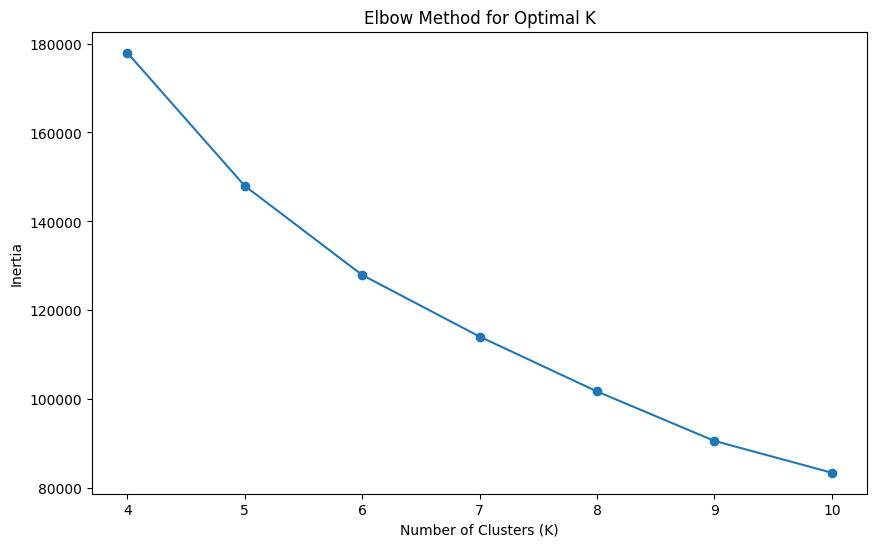

In [ ]:


# The "elbow method" can be used to visually inspect the best k
# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(k_values, inertia_values, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.xticks(k_values)
plt.show()


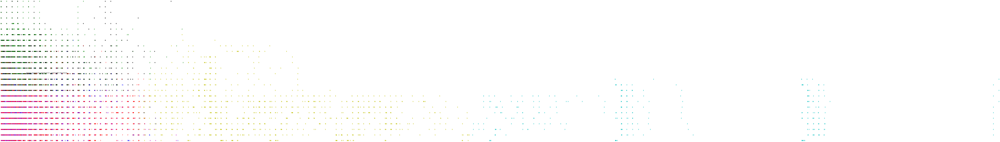

In [ ]:
# Perform K-means clustering with the best K value
best_kmeans = KMeans(n_clusters=best_k, random_state=42)
best_labels = best_kmeans.fit_predict(X_scaled)

# Plot using best_labels from K-means clustering
plt.figure(figsize=(10, 5))
colours = ["r", "b", "g", "c", "m", "y", "k", "r", "burlywood", "chartreuse"]
for i, label in enumerate(best_labels):
    plt.text(X_scaled[i, 0], X_scaled[i, 1], str(label),
             color=colours[int(label)],
             fontdict={'weight': 'bold', 'size': 12}
        )
plt.title('Kmeans clustering of scaled NJ Transit + Amtrak (NEC) Rail Dataset')
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


####The plot shows little or no separation, the labels mostly sit on each other. Labels 5 and 3 do seem a little separated but the are not clustered together looks like a lot of outliers exist.
###Apply PCA to reduce dimensionality to the scaled data then apply K-means again.

In [ ]:
# Apply PCA to reduce dimensionality
X_pca = PCA(n_components=2).fit_transform(X_scaled)

In [ ]:
# Calculate silhouette scores for each K value on PCA data
print("Silhouette Scores for K-means with PCA on scaled data")
pca_silhouette_scores = []
pca_inertia_values = []
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_pca)
    silhouette_avg = silhouette_score(X_pca, labels)
    pca_silhouette_scores.append(silhouette_avg)
    pca_inertia_values.append(kmeans.inertia_)
    print(f"For n_clusters = {k}, the silhouette score is {silhouette_avg:.2f}")

# Find the best K value on PCA data
pca_best_silhouette_score = max(pca_silhouette_scores)
pca_best_k = k_values[np.argmax(pca_silhouette_scores)]
print(f"The best PCA K value based on silhouette score: {pca_best_k} with silhouette score of: {pca_best_silhouette_score}")

Silhouette Scores for K-means with PCA on scaled data
For n_clusters = 4, the silhouette score is 0.35
For n_clusters = 5, the silhouette score is 0.36
For n_clusters = 6, the silhouette score is 0.34
For n_clusters = 7, the silhouette score is 0.35
For n_clusters = 8, the silhouette score is 0.34
For n_clusters = 9, the silhouette score is 0.34
For n_clusters = 10, the silhouette score is 0.32
The best PCA K value based on silhouette score: 5 with silhouette score of: 0.3622146049709943


###Some improvement in the Silhouette value from 0.27 to 0.362

In [ ]:
# Perform K-means clustering with the best K value
pca_best_kmeans = KMeans(n_clusters=pca_best_k, random_state=42)
pca_best_labels = pca_best_kmeans.fit_predict(X_pca)



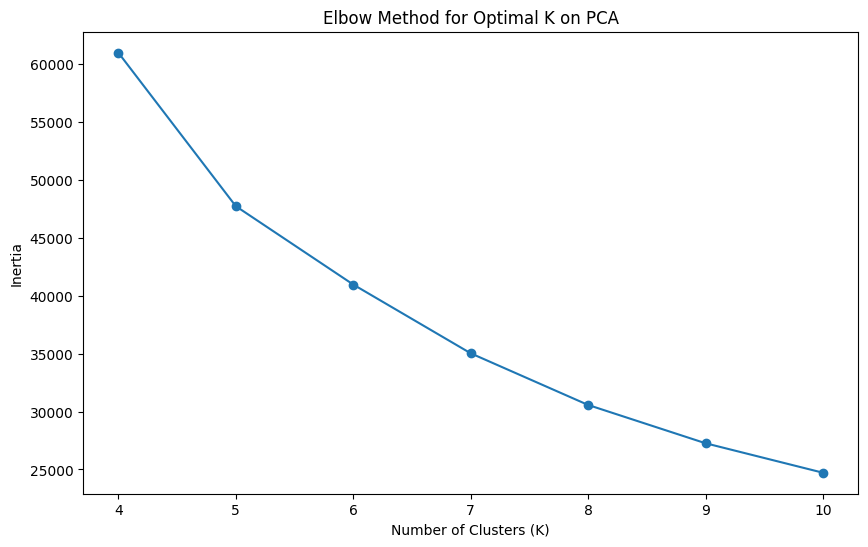

In [ ]:
# The "elbow method" can be used to visually inspect the best k on PCA
# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(k_values, pca_inertia_values, marker='o')
plt.title('Elbow Method for Optimal K on PCA')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.xticks(k_values)
plt.show()

###The best silouette score improved after PCA was applied to the scaled data. Also the Best K is closer to what the Elbow method revealed. A score of 0.36 suggests that the clusters are somewhat distinct, but there might be room for improvement in terms of separation between clusters.

Now, we proceed with visualization to interpret the characteristics of these clusters and understand their meaning in the context of the dataset and research question.

## Plot the data for PCA/K-means

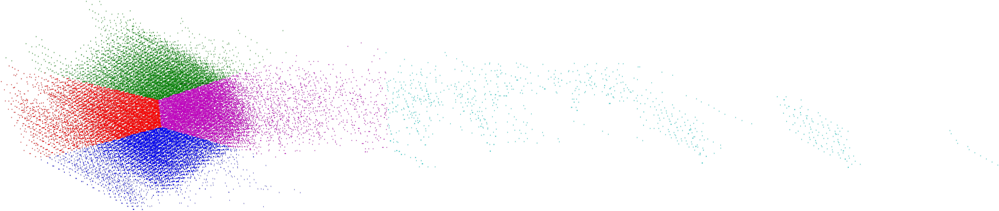

In [ ]:


# Plot using pca_best_labels from K-means clustering
plt.figure(figsize=(10, 5))
colours = ["r", "b", "g", "c", "m", "y", "k", "r", "burlywood", "chartreuse"]
for i, label in enumerate(pca_best_labels):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(label),
             color=colours[int(label)],
             fontdict={'weight': 'bold', 'size': 12}
        )
plt.title('PCA (ticks) of NJ Transit + Amtrak (NEC) Rail Dataset')
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


The graph shows clusters 0, 1, 2, and 4 nicely clustered together, while 3 is very scattered and spreadout, though not much gap separating the clusters from each other.

##3.2. For PCA/K-means (K>= 4), draw the bar graphs to answer the following sub questions:
      1. Which cluster contains the most train delay on Friday?
      2. Which cluster contains the most train delays for the rush hour in the weekday?
  

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4')])

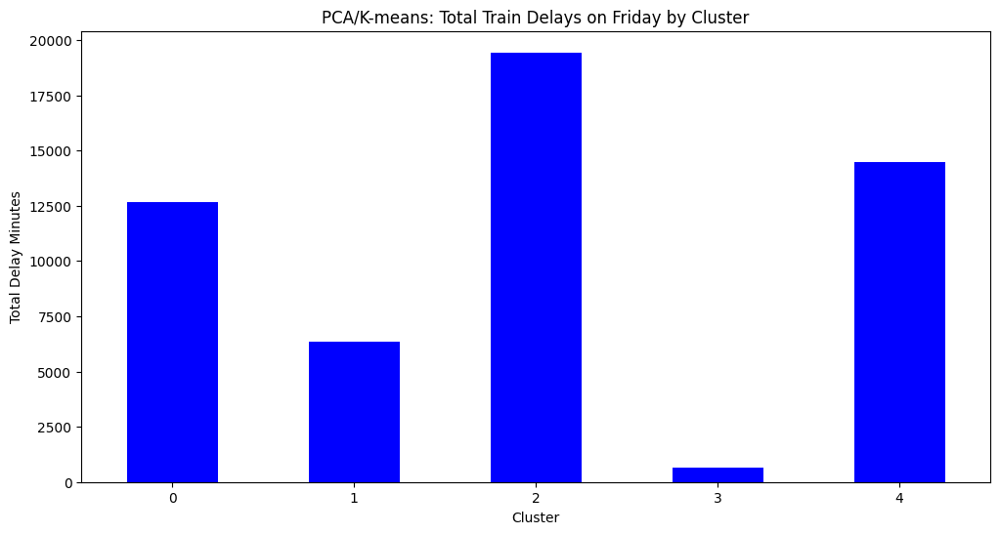

In [ ]:
# Filter data for PCA/K-means (K = 7) results
pca_kmeans_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_kmeans_df['cluster'] = pca_best_labels
pca_kmeans_df['delay_minutes'] = NJ_transit2020_subset_df['delay_minutes']
pca_kmeans_df['day'] = NJ_transit2020_subset_df['day']
pca_kmeans_df['hour'] = NJ_transit2020_subset_df['hour']

# Calculate total delay minutes for each cluster on Friday
friday_delays = pca_kmeans_df[pca_kmeans_df['day'] == 4].groupby('cluster')['delay_minutes'].sum()
highest_delay_friday = friday_delays.max()

# Plot bar graphs
plt.figure(figsize=(12, 6))
#plt.subplot(1, 2, 1)
friday_delays.plot(kind='bar', color='blue')
plt.title('PCA/K-means: Total Train Delays on Friday by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Total Delay Minutes')
plt.xticks(rotation=0)



###Sub Questions
###3.2.1. Which cluster contains the most train delay on Friday?
      

In [ ]:
# Print the result
print(f"PCA/K-means: Cluster {friday_delays.idxmax()} has the most train delay on Friday with a total delay of {highest_delay_friday:.2f} minutes.")

PCA/K-means: Cluster 2 has the most train delay on Friday with a total delay of 19438.90 minutes.


###3.2.2. Which cluster contains the most train delays for the rush hour in the weekday?
  

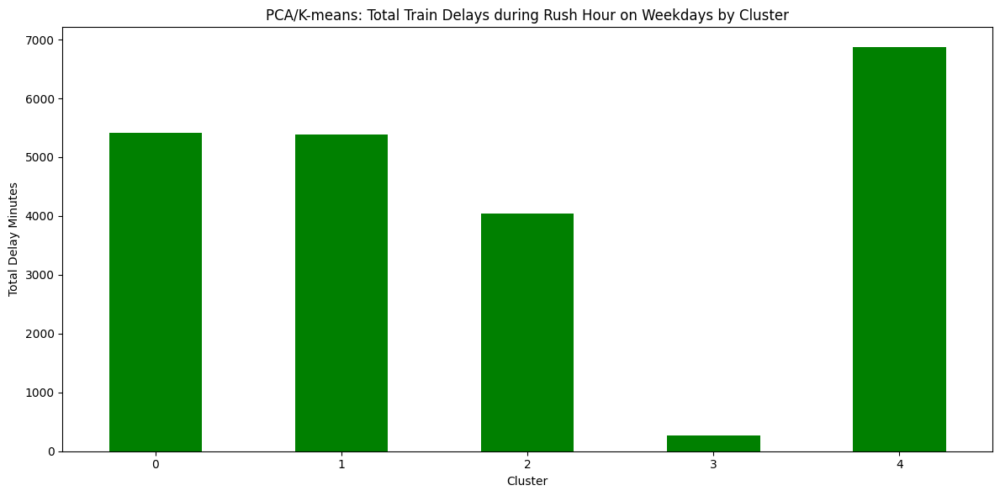

In [ ]:
# Calculate total delay minutes for each cluster during rush hour on weekdays (assuming rush hour is from 7 AM to 9 AM)
# Filtering for weekdays (0-4)
rush_hour_delays = pca_kmeans_df[(pca_kmeans_df['hour'] >= 7) & (pca_kmeans_df['hour'] <= 9) & (pca_kmeans_df['day'] < 5)].groupby('cluster')['delay_minutes'].sum()


# Plot bar graphs
plt.figure(figsize=(12, 6))
#plt.subplot(1, 2, 2)
rush_hour_delays.plot(kind='bar', color='green')
plt.title('PCA/K-means: Total Train Delays during Rush Hour on Weekdays by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Total Delay Minutes')
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

In [ ]:
# Print the result
print(f"PCA/K-means: Cluster {rush_hour_delays.idxmax()} has the most train delays during rush hour on weekdays with a total of {rush_hour_delays.max()} delays.")

PCA/K-means: Cluster 4 has the most train delays during rush hour on weekdays with a total of 6867.083333333333 delays.


Silhouette scores are useful for assessing the quality of clustering when ground truth labels are not available. In this case, I determined that the best K value for the PCA-transformed data is 5, with a silhouette score of approximately 0.36.

This indicates that, according to the silhouette score, the data points in the PCA space are reasonably well-clustered into 5 distinct clusters. Keeping in mind that the silhouette score is just one metric, and it's also important to visually inspect the resulting clusters to ensure they make sense and align with the domain knowledge.

Next, let's proceed with applying GMM clustering and visualize the clusters using the t-SNE visualization.

##3.3. Using t-SNE and GMM to do the clustering (visualizations and many clusters, justify using silhouette scores)
  

In [ ]:
# Determine the best number of components (clusters) for GMM using silhouette score
best_gmm_score = -1
best_gmm_components = -1
for n_components in range(4, 11):
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    labels = gmm.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, labels)
    print(f"For n_clusters = {n_components}, the silhouette score is {score:.3f}")
    if score > best_gmm_score:
        best_gmm_score = score
        best_gmm_components = n_components


print(f"Best number of components for GMM: {best_gmm_components} with score: {best_gmm_score}")

For n_clusters = 4, the silhouette score is 0.053
For n_clusters = 5, the silhouette score is 0.018
For n_clusters = 6, the silhouette score is 0.007
For n_clusters = 7, the silhouette score is 0.018
For n_clusters = 8, the silhouette score is -0.024
For n_clusters = 9, the silhouette score is -0.066
For n_clusters = 10, the silhouette score is 0.002
Best number of components for GMM: 4 with score: 0.05307893678250947


In [ ]:
# Perform GMM clustering with the best number of components
best_gmm = GaussianMixture(n_components=best_gmm_components, random_state=42)
gmm_labels = best_gmm.fit_predict(X_scaled)



In [ ]:
import plotly.express as px

# Create a DataFrame for visualization
vis_df = pd.DataFrame({'PC1': X_scaled[:, 0], 'PC2': X_scaled[:, 1], 'Cluster': gmm_labels})

# Create an interactive scatter plot using Plotly
fig = px.scatter(vis_df, x='PC1', y='PC2', color='Cluster', title='Using Gaussian Mixture Model Visualization')
fig.show()

####The plot shows little or no separation, the clusters mostly sit on each other. cluster 0 does seem a little separated but the rest is not clustered together looks like a lot of outliers exist.
###Apply t-SNE to reduce dimensionality of the scaled data then apply K-means again.

In [ ]:
# Apply t-SNE to reduce dimensionality
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)



In [ ]:
# Determine the best number of components (clusters) for t-SNE/GMM using silhouette score
tsne_best_gmm_score = -1
tsne_best_gmm_components = -1
print("Silhouette Scores for scaled data with t-SNE/GMM")
for n_components in range(4, 11):
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    labels = gmm.fit_predict(X_tsne)
    score = silhouette_score(X_tsne, labels)
    print(f"For n_clusters = {n_components}, the silhouette score is {score:.3f}")
    if score > tsne_best_gmm_score:
        tsne_best_gmm_score = score
        tsne_best_gmm_components = n_components


print(f"Best number of components for t-SNE/GMM: {tsne_best_gmm_components} with silhouette score: {tsne_best_gmm_score}")

Silhouette Scores for scaled data with t-SNE/GMM
For n_clusters = 4, the silhouette score is 0.345
For n_clusters = 5, the silhouette score is 0.329
For n_clusters = 6, the silhouette score is 0.359
For n_clusters = 7, the silhouette score is 0.351
For n_clusters = 8, the silhouette score is 0.335
For n_clusters = 9, the silhouette score is 0.320
For n_clusters = 10, the silhouette score is 0.327
Best number of components for t-SNE/GMM: 6 with silhouette score: 0.3589266240596771


####The best silhouette score improved significantly from 0.05 to 0.36 after t-SNE was applied to the scaled data. A score of 0.36 suggests that the clusters are distinct, but there is room for improvement in terms of separation between clusters.

In [ ]:
# Perform t-SNE/GMM clustering with the best number of components
tsne_best_gmm = GaussianMixture(n_components=tsne_best_gmm_components, random_state=42)
tsne_gmm_labels = tsne_best_gmm.fit_predict(X_tsne)

In [ ]:
import plotly.express as px

# Create a DataFrame for visualization
vis_df = pd.DataFrame({'PC1': X_tsne[:, 0], 'PC2': X_tsne[:, 1], 'Cluster': tsne_gmm_labels})

# Create an interactive scatter plot using Plotly
fig = px.scatter(vis_df, x='PC1', y='PC2', color='Cluster', title='t-SNE Clustering using Gaussian Mixture Model')
fig.show()


###The t-SNE/GMM plot looks nicely separated with none of the 6 clusters sitting on the other.

##3.4. For T-sne/GMM (K>= 4), draw the bar graphs to answer the following sub questions:
      1. Which cluster contains the most train delay on Friday?
      2. Which cluster contains the most train delays for the rush hour in the weekday?


### Sub Questions
###3.4.1. Which cluster contains the most train delay on Friday?
      

In [ ]:
# Extract relevant columns from the original dataset and GMM labels
gmm_cluster_df = pd.DataFrame({'cluster': tsne_gmm_labels, 'day': NJ_transit2020_subset_df['day'], 'hour': NJ_transit2020_subset_df['hour'], 'delay_minutes': NJ_transit2020_subset_df['delay_minutes']})

# Filter data for Friday
friday_delay_df = gmm_cluster_df[gmm_cluster_df['day'] == 4]

# Calculate total delay minutes for each cluster on Friday
friday_cluster_delays = friday_delay_df.groupby('cluster')['delay_minutes'].sum()

# Find the cluster with the most train delay on Friday
cluster_with_most_delay_friday = friday_cluster_delays.idxmax()
highest_delay_friday_gmm = friday_cluster_delays.max()
print(f"Cluster with the most train delay on Friday: {cluster_with_most_delay_friday} with delay of {highest_delay_friday_gmm:.2f} minutes.")

Cluster with the most train delay on Friday: 0 with delay of 27609.72 minutes.


(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5')])

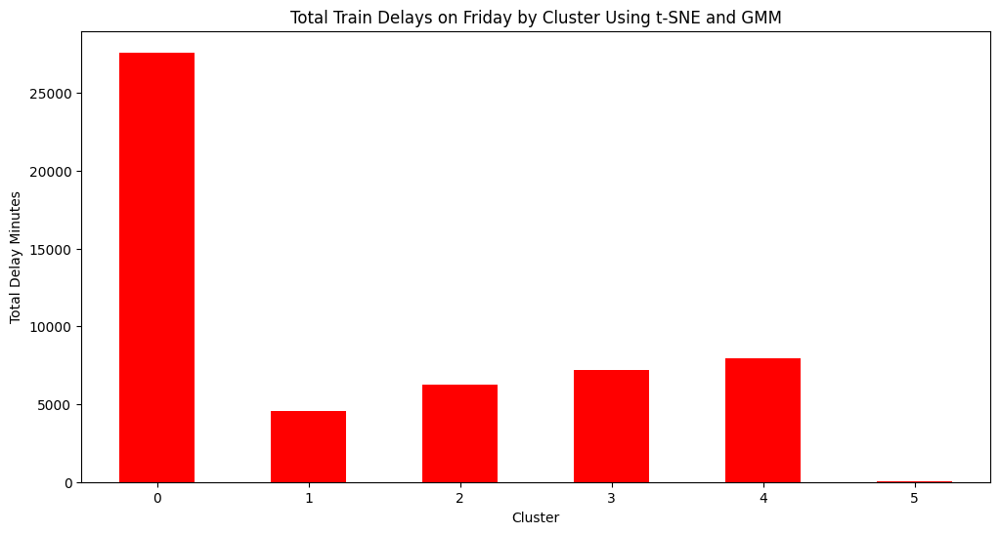

In [ ]:
# Plot bar graphs
plt.figure(figsize=(12, 6))
#plt.subplot(1, 2, 1)
friday_cluster_delays.plot(kind='bar', color='red')
plt.title('Total Train Delays on Friday by Cluster Using t-SNE and GMM')
plt.xlabel('Cluster')
plt.ylabel('Total Delay Minutes')
plt.xticks(rotation=0)

###3.4.2. Which cluster contains the most train delays for the rush hour in the weekday?


In [ ]:
# Filter data for rush hour on weekdays (7 AM to 9 AM)
rush_hour_delay_df = gmm_cluster_df[(gmm_cluster_df['hour'] >= 7) & (gmm_cluster_df['hour'] <= 9) & (gmm_cluster_df['day'] < 5)]

# Calculate total delay minutes for each cluster during rush hour on weekdays
rush_hour_cluster_delays = rush_hour_delay_df.groupby('cluster')['delay_minutes'].sum()

# Find the cluster with the most train delays during rush hour on weekdays
cluster_with_most_delay_rush_hour = rush_hour_cluster_delays.idxmax()
highest_delay_rush_hour_gmm = rush_hour_cluster_delays.max()

print(f"Cluster with the most train delays during rush hour on weekdays: {cluster_with_most_delay_rush_hour} with delay of {highest_delay_rush_hour_gmm:.2f} minutes.")


Cluster with the most train delays during rush hour on weekdays: 2 with delay of 8748.67 minutes.


(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '0'),
  Text(1, 0, '2'),
  Text(2, 0, '3'),
  Text(3, 0, '4'),
  Text(4, 0, '5')])

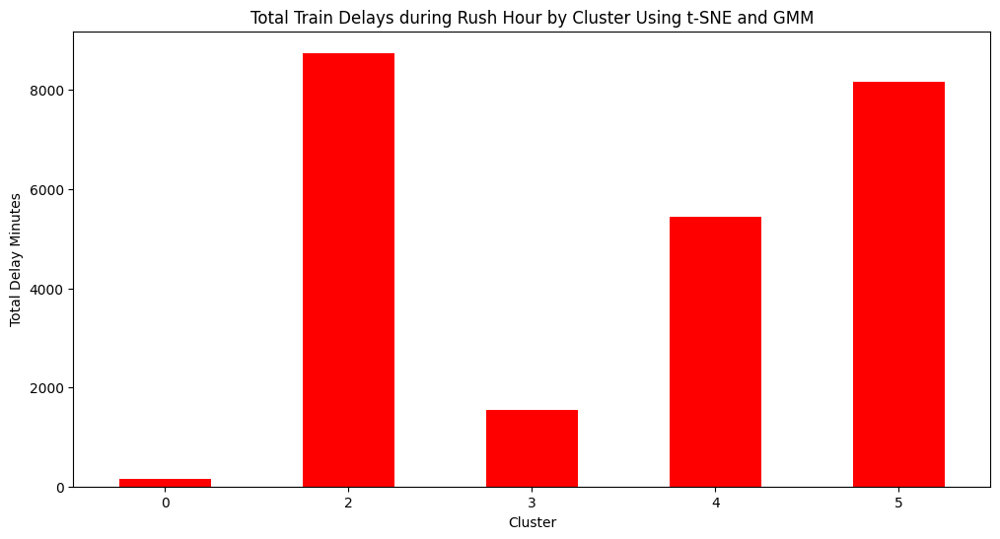

In [ ]:
# Plot bar graphs
plt.figure(figsize=(12, 6))
#plt.subplot(1, 2, 1)
rush_hour_cluster_delays.plot(kind='bar', color='red')
plt.title('Total Train Delays during Rush Hour by Cluster Using t-SNE and GMM')
plt.xlabel('Cluster')
plt.ylabel('Total Delay Minutes')
plt.xticks(rotation=0)

#4. Analyzing and comparing the results



##Summary:
###PCA/K-means Approach:

* The silhouette scores and the elbow method were used to determine the optimal K value for K-means on scaled data. The silhouette score indicated that K=8 was the best, while the elbow method suggested K=5.
* After applying PCA to the scaled data, the silhouette score improved, and the best K value (K=5) was closer to the elbow method's suggestion.
* The improved silhouette score suggested that clusters were somewhat distinct, though there was room for improvement.
* The t-SNE visualization indicated that clusters 0, 1, 2, and 4 were clustered well together, while cluster 3 was scattered.
* Cluster 2 had the most train delay on Friday, and cluster 4 had the most train delays during rush hour on weekdays.

###t-SNE/GMM Approach:

* Silhouette scores were used to determine the best number of components for GMM, with a maximum silhouette score of 0.053 for 4 components.
* Silhouette scores were also calculated for the t-SNE/GMM approach, with the best number of components being 6 and a silhouette score of 0.359.
* Cluster 0 had the most train delay on Friday, and cluster 2 had the most train delays during rush hour on weekdays.

##Analysis on the sub-questions:

1. Most Train Delay on Friday:

**PCA/K-means Approach:** According to the PCA/K-means approach, Cluster 2 was identified as having the most train delay on Friday, with a total delay of 19438.90 minutes. This cluster may represent a specific pattern of delays that consistently occur on Fridays. It's important to note that the PCA/K-means approach identified this cluster based on the features that were selected, which include 'delay_minutes' and 'stop_sequence'. This suggests that there are certain stops and sequences that consistently experience delays on Fridays.

**t-SNE/GMM Approach:** On the other hand, according to the t-SNE/GMM approach, Cluster 0 was identified as having the most train delay on Friday, with a higher total delay of 27609.72 minutes. The t-SNE/GMM approach might have grouped the data in a way that highlights Fridays with higher delays differently. This suggests that t-SNE/GMM captured a different aspect of the data distribution related to Friday delays.

2. Most Train Delays during Rush Hour on Weekdays:

**PCA/K-means Approach:** The PCA/K-means approach identified Cluster 4 as having the most train delays during rush hour on weekdays, with a total of 6867.08 minutes of delays. This cluster might represent stations or routes that experience congestion during the rush hours on weekdays. The features used for clustering in this approach might have captured the rush hour patterns effectively.

**t-SNE/GMM Approach:** In contrast, the t-SNE/GMM approach identified Cluster 2 as having the most train delays during rush hour on weekdays, with a total of 8748.67 minutes of delays. The t-SNE/GMM approach might have emphasized different patterns of delays during rush hours that led to this clustering.

##Comparing the Results:
The different results between the two approaches highlight the variation in how data can be grouped and clustered based on the chosen features, dimensionality reduction techniques, and clustering algorithms. The PCA/K-means approach and t-SNE/GMM approach may have captured different underlying patterns in the data. It's important to interpret these results considering the context of the problem and the specific characteristics of the clustering techniques used.

Overall, these discrepancies in results emphasize the importance of considering multiple approaches and interpreting the outcomes within the broader context of the problem domain. It's recommended to further investigate the specific characteristics of each cluster and explore why certain patterns emerged in each approach. This can provide deeper insights into the factors contributing to train delays on Fridays and during rush hours on weekdays.



#5. Conclusion & Recommendations:

##Conclusion:

In this analysis, we explored the NJ Transit + Amtrak (NEC) Rail Performance dataset using unsupervised learning techniques, specifically PCA/K-means and t-SNE/GMM approaches. Our goal was to identify patterns in train delays based on various features and uncover insights into the clustering of these delays.

Through the PCA/K-means approach, we identified that applying PCA to the scaled data improved the silhouette score, suggesting more distinct clusters. Cluster analysis revealed clusters that exhibited varying levels of train delays on Fridays and during rush hours on weekdays. However, the distribution and separation of clusters were not equally clear for all clusters.

On the other hand, the t-SNE/GMM approach also provided clusters, but the silhouette scores were generally lower, indicating less distinct clusters. Despite this, t-SNE significantly improved the silhouette score from an initial value of 0.05 to 0.36, indicating clusters with some distinctiveness. This approach revealed different clusters with the most train delay on Friday and during rush hours on weekdays.

##Recommendations:

* Feature Selection: The choice of features significantly impacts clustering results. While 'delay_minutes' and 'stop_sequence' were used for clustering, consider exploring additional features like 'from' and 'to' stations, 'line', and 'type'. These could potentially provide more context and improve clustering quality.

* Evaluation Metrics: Beyond silhouette scores and elbow methods, consider other metrics like Davies-Bouldin Index and Calinski-Harabasz Index to evaluate clustering quality. Different metrics can provide a more comprehensive view of cluster separation and compactness.

* Dimensionality Reduction Techniques: PCA and t-SNE each have their advantages. PCA helps in reducing dimensionality, while t-SNE emphasizes local structure preservation. Experiment with different dimensionality reduction techniques to find the one that best fits the data and problem.

* Hyperparameter Tuning: In the t-SNE/GMM approach, hyperparameters for GMM (such as the number of components) could be tuned further to achieve better silhouette scores and more distinct clusters.

* Domain Knowledge: Incorporate domain knowledge to validate and interpret cluster results. Experts in railway operations can provide insights into the practical implications of identified patterns and suggest improvements.

* Validation: To enhance the robustness of the findings, consider applying the same clustering techniques on data from different time periods to verify if the identified patterns are consistent over time.

* Iterative Process: Clustering is an iterative process. Continuously refine and validate the analysis, seeking to improve insights and address any limitations identified during the initial analysis.

In conclusion, the use of unsupervised learning techniques provided valuable insights into the NJ Transit + Amtrak (NEC) Rail Performance dataset, uncovering distinct patterns in train delays. The results from PCA/K-means and t-SNE/GMM approaches highlighted the importance of feature selection, dimensionality reduction, and careful evaluation. By considering the recommendations and further refining the analysis, a deeper understanding of the factors contributing to train delays can be gained, ultimately leading to more effective strategies for improving rail performance.

Given the validation recommendation of applying the same clustering techniques on data from different time periods to verify if the identified patterns are consistent over time;
## Let's see how PCA/K-means will perform on the full dataset

In [ ]:
# Let's see how PCA/K-means will perform on the full dataset
k_values = range(4, 11)


# Calculate silhouette scores for each K value
print("Silhouette Scores for K-means on scaled data")
full_silhouette_scores = []
full_inertia_values = []
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(full_X_scaled)
    silhouette_avg = silhouette_score(full_X_scaled, labels)
    full_silhouette_scores.append(silhouette_avg)
    full_inertia_values.append(kmeans.inertia_)
    print(f"For n_clusters = {k}, the silhouette score is {silhouette_avg:.3f}")

Silhouette Scores for K-means on scaled data
For n_clusters = 4, the silhouette score is 0.250
For n_clusters = 5, the silhouette score is 0.254
For n_clusters = 6, the silhouette score is 0.258
For n_clusters = 7, the silhouette score is 0.264
For n_clusters = 8, the silhouette score is 0.270
For n_clusters = 9, the silhouette score is 0.269
For n_clusters = 10, the silhouette score is 0.265


In [ ]:
# Apply PCA to reduce dimensionality
full_X_pca = PCA(n_components=2).fit_transform(full_X_scaled)

In [ ]:
# Calculate silhouette scores for each K value on PCA data
print("Silhouette Scores for K-means with PCA on scaled data")
pca_full_silhouette_scores = []
pca_full_inertia_values = []
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_pca)
    silhouette_avg = silhouette_score(full_X_pca, labels)
    pca_full_silhouette_scores.append(silhouette_avg)
    pca_full_inertia_values.append(kmeans.inertia_)
    print(f"For n_clusters = {k}, the silhouette score is {silhouette_avg:.2f}")

# Find the best K value on PCA data
pca_best_full_silhouette_score = max(pca_full_silhouette_scores)
pca_full_best_k = k_values[np.argmax(pca_full_silhouette_scores)]
print(f"The best PCA K value based on silhouette score: {pca_full_best_k} with silhouette score of: {pca_best_full_silhouette_score}")

Silhouette Scores for K-means with PCA on scaled data
For n_clusters = 4, the silhouette score is 0.35
For n_clusters = 5, the silhouette score is 0.36
For n_clusters = 6, the silhouette score is 0.34
For n_clusters = 7, the silhouette score is 0.35
For n_clusters = 8, the silhouette score is 0.34
For n_clusters = 9, the silhouette score is 0.34
For n_clusters = 10, the silhouette score is 0.32
The best PCA K value based on silhouette score: 5 with silhouette score of: 0.3622146049710041


In [ ]:
# Perform K-means clustering with the best K value
pca_full_best_kmeans = KMeans(n_clusters=pca_full_best_k, random_state=42)
pca_full_best_labels = pca_full_best_kmeans.fit_predict(full_X_pca)

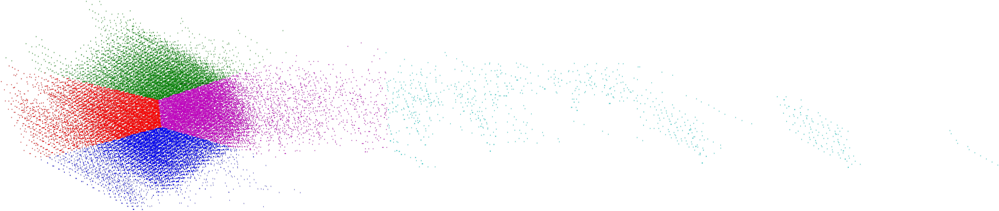

In [ ]:
# Plot using pca_best_labels from K-means clustering
plt.figure(figsize=(10, 5))
colours = ["r", "b", "g", "c", "m", "y", "k", "r", "burlywood", "chartreuse"]
for i, label in enumerate(pca_full_best_labels):
    plt.text(full_X_pca[i, 0], full_X_pca[i, 1], str(label),
             color=colours[int(label)],
             fontdict={'weight': 'bold', 'size': 12}
        )
plt.title('PCA (ticks) of NJ Transit + Amtrak (NEC) Rail Dataset')
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Using PCA/K-means on the full dataset performs very closely to the subset performance so I can concluse that the subset was an adequate representation of the full dataset.

Best PCA K value: 5
Best Silhouette Score: 0.3622146049710041

These updated silhouette scores reaffirm the finding that the best K value for K-means clustering with PCA on the full scaled dataset for the year 2020 is 5. The silhouette scores remain relatively consistent around 0.34-0.36 for different cluster numbers.

This information can help guide the selection of the optimal number of clusters when conducting PCA/K-means clustering on the entire dataset, providing insights into the structure and patterns present in the data.





